In [22]:
# for loading/processing the images
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [23]:
path = "/home/user/Desktop/ML/flower_images/flower_images"
os.chdir(path)

In [24]:
flowers = []

with os.scandir(path) as files:
    for file in files:
        if file.name.endswith('.png'):
            flowers.append(file.name)

In [40]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-3].output)

In [26]:
def extract_features(file, model):
    file = "/home/user/Desktop/ML/flower_images/flower_images/" + file
    img = load_img(file, target_size = (224, 224))
    img = np.array(img)
    reshaped_img = img.reshape(1, 224, 224, 3)
    imgx = preprocess_input(reshaped_img)
    features = model.predict(imgx)

    return features

In [41]:
data = {}
p = r"flower_features.pk1"

for flower in flowers:
    feat = extract_features(flower, model)
    data[flower] = feat

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [42]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1, 4096)

In [43]:
# get the unique labels (from the flower_labels.csv)
df = pd.read_csv('/home/user/Desktop/ML/flower_images/flower_images/flower_labels.csv')
true_labels = df['label'].tolist()
unique_labels = list(set(true_labels))

In [44]:
# reduce the amount of dimensions in the feature vector
pca = PCA(n_components = 100, random_state = 22)
x = pca.fit_transform(feat)

In [45]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Create a logistic regression estimator
estimator = LogisticRegression(max_iter = 1000)

# Select the top 100 features using RFE
selector = RFE(estimator, n_features_to_select = 100)
selector = selector.fit(x, true_labels)  # Use true labels to guide selection

# Get the selected features
selected_features = selector.transform(x)

# Cluster using the selected features
kmeans = KMeans(n_clusters = len(unique_labels), random_state = 22)
kmeans.fit(selected_features)

KMeans(n_clusters=10, random_state=22)

In [46]:
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [47]:
def view_cluster(cluster):
    plt.figure(figsize = (25, 25));
    files = groups[cluster]
    if len(files) > 30:
        print("Clipping cluster size from", {len(files)}, "to 30")
        files = files[:29]

    for index, file in enumerate(files):
        file = "/home/user/Desktop/ML/flower_images/flower_images/" + file

        plt.subplot(10, 10, index + 1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

Clipping cluster size from {75} to 30
Clipping cluster size from {36} to 30


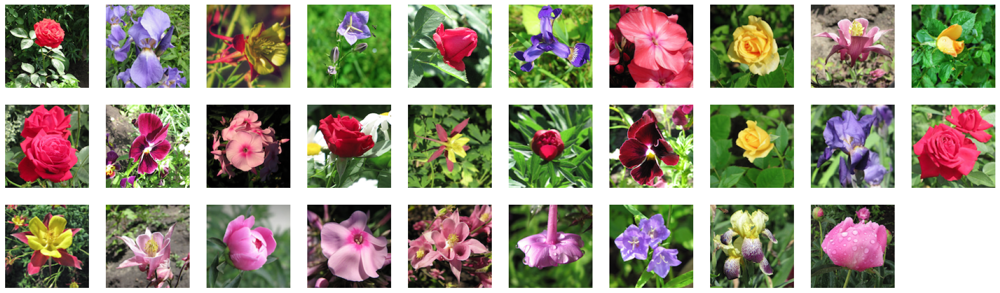

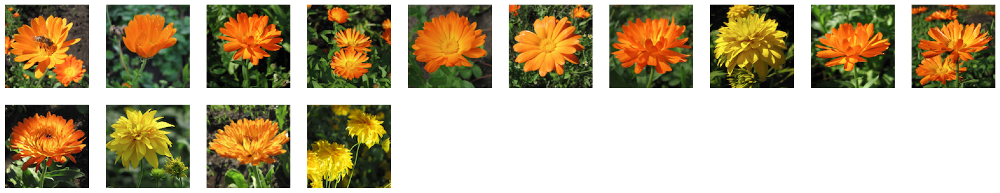

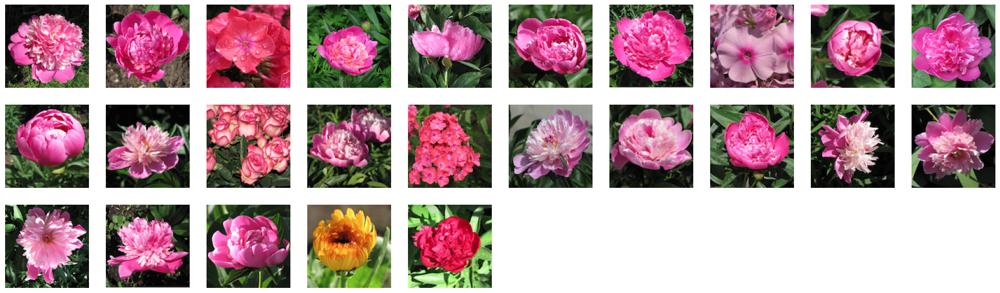

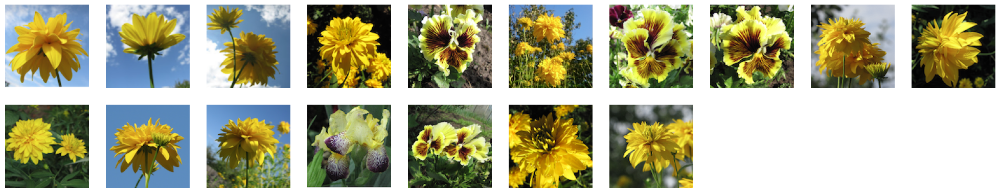

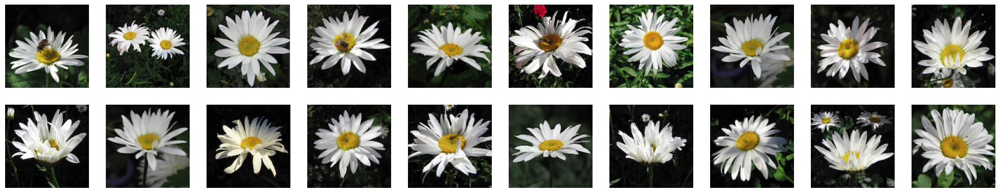

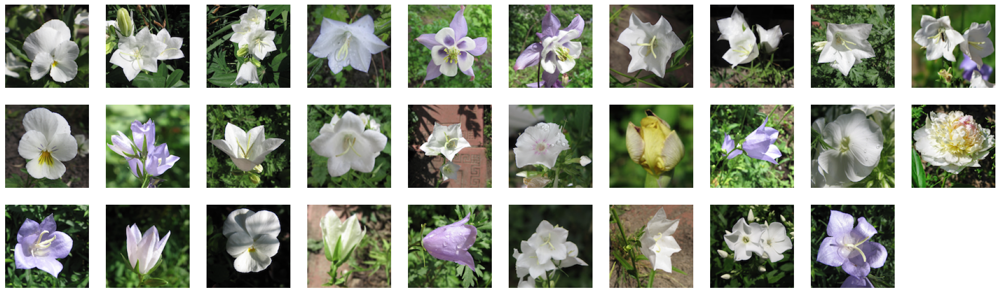

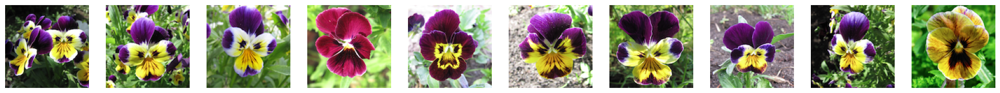

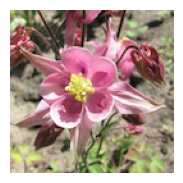

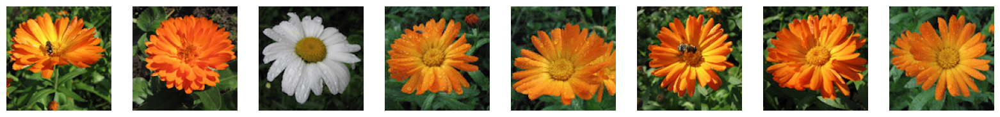

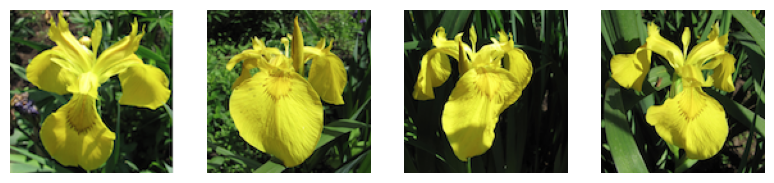

In [48]:
for cluster_id in groups:
    view_cluster(cluster_id)

plt.show()

Adjusted Rand Index (ARI): 0.004632733639113345


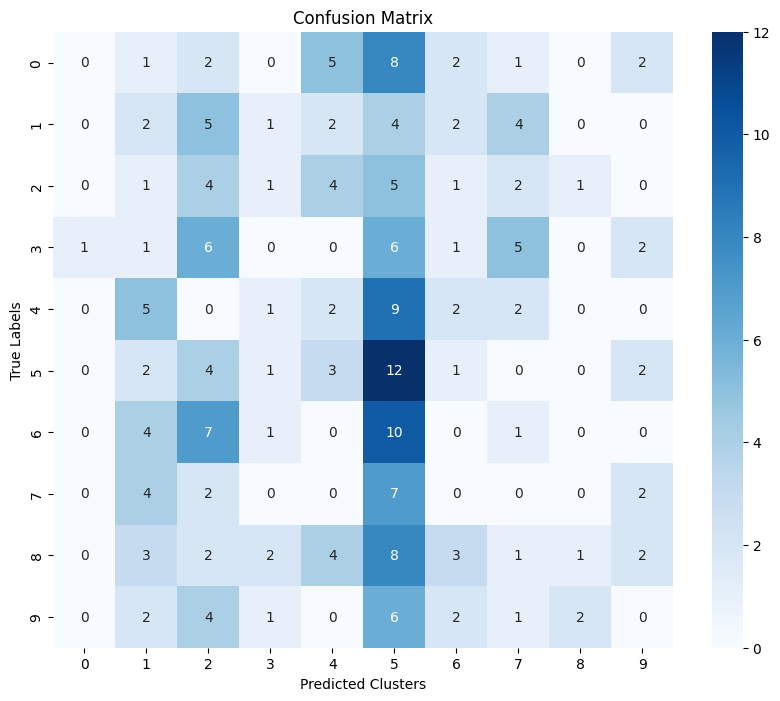

In [49]:
from sklearn.metrics import adjusted_rand_score, confusion_matrix
import seaborn as sns  # For better confusion matrix visualization

# 1. Get True Labels in the Same Format
true_labels = df['label'].tolist()  # List of true labels from your CSV

# 2. Calculate Adjusted Rand Index (ARI)
ari = adjusted_rand_score(true_labels, kmeans.labels_)
print(f"Adjusted Rand Index (ARI): {ari}")

# 3. Build and Visualize Confusion Matrix
conf_matrix = confusion_matrix(true_labels, kmeans.labels_)

# Optionally map cluster IDs to labels for better interpretation
cluster_label_mapping = {i: unique_labels[i] for i in range(len(unique_labels))} 
conf_matrix_labeled = pd.DataFrame(conf_matrix, index=unique_labels, columns=unique_labels)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_labeled, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Clusters")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

In [50]:
# Load the labels from the CSV file
true_labels = df['label'].tolist()

# Associate each filename with its corresponding label
filename_to_label = dict(zip(filenames, true_labels))

In [51]:
# Determine the most frequent label for each cluster
cluster_to_label = {}
for cluster_id, files in groups.items():
    labels_in_cluster = [filename_to_label[file] for file in files]
    most_common_label = max(set(labels_in_cluster), key = labels_in_cluster.count)
    cluster_to_label[cluster_id] = most_common_label

In [52]:
# Assign predicted labels based on cluster_to_label mapping
predicted_labels = [cluster_to_label[cluster] for cluster in kmeans.labels_]

In [53]:
# Calculate accuracy
correct = sum(1 for true, pred in zip(true_labels, predicted_labels) if true == pred)
total = len(true_labels)
accuracy = (correct / total) * 100

print(f"Number of correctly clustered images: {correct}")
print(f"Total number of images: {total}")
print(f"Clustering accuracy: {accuracy:.2f}%")

Number of correctly clustered images: 44
Total number of images: 210
Clustering accuracy: 20.95%
